# Libreries

In [2]:
import os
import random
import shutil
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

import torch
import torch.nn as nn
from torch.optim import SGD, AdamW
from torch.utils.data import DataLoader, Dataset, random_split, ConcatDataset
from pytorch_lightning.callbacks import EarlyStopping
import torchvision
from torchsummary import summary
from torch.optim.lr_scheduler import ReduceLROnPlateau

from torchvision import transforms
from torchvision.utils import make_grid

import pytorch_lightning as pl

from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

import warnings

# Disabilita tutti i warning
warnings.filterwarnings("ignore")

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
def show_image(image_path):
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Rimuove gli assi dall'immagine
    plt.show()

# Data preprocessing

In [3]:
# import os
# from PIL import Image
# import torchvision.transforms.functional as F

# class PadIfNeeded:
#     def __init__(self, min_size, padding_mode='constant'):
#         self.min_size = min_size
#         self.padding_mode = padding_mode

#     def __call__(self, img):
#         # Calculate padding if needed
#         padding_left = max(0, (self.min_size[0] - img.size[0]) // 2)
#         padding_right = max(0, self.min_size[0] - img.size[0] - padding_left)
#         padding_top = max(0, (self.min_size[1] - img.size[1]) // 2)
#         padding_bottom = max(0, self.min_size[1] - img.size[1] - padding_top)
        
#         # Apply padding
#         img = F.pad(img, (padding_left, padding_top, padding_right, padding_bottom), padding_mode=self.padding_mode)
#         return img

# def process_and_save_images(input_folder, output_folder, transform):
#     # Create the output folder if it doesn't exist
#     os.makedirs(output_folder, exist_ok=True)
    
#     # Iterate through all images in the input folder
#     for filename in os.listdir(input_folder):
#         if filename.endswith((".png", ".jpg", ".jpeg")):
#             # Open the image
#             img_path = os.path.join(input_folder, filename)
#             image = Image.open(img_path).convert("RGB")
            
#             # Apply the transformation
#             transformed_image = transform(image)
            
#             # Save the transformed image to the output folder
#             output_path = os.path.join(output_folder, filename)
#             transformed_image.save(output_path)
#             print(f"Saved transformed image to {output_path}")

# def resize_images(input_folder, output_folder, size=(256, 256)):
#     # Create the output folder if it doesn't exist
#     os.makedirs(output_folder, exist_ok=True)
    
#     # Iterate through all images in the input folder
#     for filename in os.listdir(input_folder):
#         if filename.endswith((".png", ".jpg", ".jpeg")):
#             # Open the image
#             img_path = os.path.join(input_folder, filename)
#             image = Image.open(img_path).convert("RGB")
            
#             # Resize the image
#             resized_image = image.resize(size)
            
#             # Save the resized image to the output folder
#             output_path = os.path.join(output_folder, filename)
#             resized_image.save(output_path)
#             print(f"Saved resized image to {output_path}")


In [ ]:
# def verify_images(dataset):
#     images = os.listdir(dataset)
#     for img in images:
#         img_path = os.path.join(dataset, img)
#         try:
#             with Image.open(img_path) as img_file:
#                 img_file.verify()
#         except (IOError, SyntaxError) as e:
#             print(f"Corrupted image file: {img_path}")

# # Use the function
# verify_images("Flickr2K_Padded")

In [ ]:
# # Define the padding transformation
# pad_transform = PadIfNeeded(min_size=(2048, 2048))

# # Process the images in the "Flickr2K" folder and save them to a new folder "Flickr2K_Padded"
# process_and_save_images("Flickr2K", "Flickr2K_Padded", pad_transform)

# # Resize the padded images to 256x256 and save them to "Flickr2K_Padded_Resized"
# resize_images("Flickr2K_Padded", "Flickr256_Padded", size=(256, 256))

In [ ]:
# resize_images("Flickr256_Padded", "Flickr64_Padded", size=(64, 64))

# Utility functions

In [4]:
def calculate_psnr(image1, image2):
    # Convert images to numpy arrays and scale to [0, 1]
    image1_np = image1.cpu().numpy().transpose(1, 2, 0)
    image2_np = image2.cpu().numpy().transpose(1, 2, 0)
    image1_np = (image1_np - image1_np.min()) / (image1_np.max() - image1_np.min())
    image2_np = (image2_np - image2_np.min()) / (image2_np.max() - image2_np.min())

    return psnr(image1_np, image2_np, data_range=1.0)

def calculate_ssim(image1, image2):
    # Convert images to numpy arrays and scale to [0, 1]
    image1_np = image1.cpu().numpy().transpose(1, 2, 0)
    image2_np = image2.cpu().numpy().transpose(1, 2, 0)
    image1_np = (image1_np - image1_np.min()) / (image1_np.max() - image1_np.min())
    image2_np = (image2_np - image2_np.min()) / (image2_np.max() - image2_np.min())

    return ssim(image1_np, image2_np, data_range=1.0, multichannel=True, win_size=3, channel_axis=-1)

def show_images(model, original_size, scaled_size):
    titles = ['Sr Images', 'Input Images', 'Reconstructed Images']
    image_groups = [model.validation_results['original'],
                    model.validation_results['inputs'],
                    model.validation_results['outputs']]

    Sr_images = model.validation_results['original']
    input_images = model.validation_results['inputs']
    reconstructed_images = model.validation_results['outputs']

    # Calculate PSNR and SSIM
    psnr_reconstructed = np.mean([calculate_psnr(Sr, reconstructed) for Sr, reconstructed in zip(Sr_images, reconstructed_images)])

    ssim_reconstructed = np.mean([calculate_ssim(Sr, reconstructed) for Sr, reconstructed in zip(Sr_images, reconstructed_images)])

    print(f"Average PSNR between Sr and reconstructed images: {psnr_reconstructed:.2f} dB")
    print(f"Average SSIM between Sr and reconstructed images: {ssim_reconstructed:.4f}")

    for images, title in zip(image_groups, titles):
        if title == 'Input Images':
            size = scaled_size
        else:
            size = original_size
        
        images = torchvision.utils.make_grid(images.view(-1, 3, size, size)[:5, ...], nrow=5, normalize=True)
        images_np = images.permute(1, 2, 0).cpu().numpy()

        plt.figure(figsize=(15, 15))
        plt.title(title)
        plt.imshow(images_np)
        plt.axis('off')
        plt.show()

In [5]:
class ImageDataset(Dataset):
    def __init__(self, dataset_sr_dir, dataset_lr_dir, transform_original=None, transform_rescaled=None):
        self.dataset_sr_dir = dataset_sr_dir
        self.dataset_lr_dir = dataset_lr_dir
        
        self.transform_original = transform_original
        self.transform_rescaled = transform_rescaled
        
        self.images_sr = os.listdir(dataset_sr_dir)
        self.images_lr = os.listdir(dataset_lr_dir)
        
    def __len__(self):
        return len(self.images_sr)

    def __getitem__(self, idx):
        img_sr_path = os.path.join(self.dataset_sr_dir, self.images_sr[idx])
        img_lr_path = os.path.join(self.dataset_lr_dir, self.images_lr[idx])
        
        try:
            original_image = Image.open(img_sr_path).convert("RGB")
            rescaled_image = Image.open(img_lr_path).convert("RGB")
            
        except OSError:
            print(f"Skipping corrupted image: {img_sr_path}")
            return self.__getitem__((idx + 1) % len(self.images))
        
        if self.transform_original:
            original_image = self.transform_original(original_image)
        
        if self.transform_rescaled:
            rescaled_image = self.transform_rescaled(rescaled_image)

        return rescaled_image, original_image
    

def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Imposta il seed per rendere l'esperimento ripetibile
seed = 42
set_seed(seed)

# Experiments

### Data loader

In [ ]:
original_size = 256

scaled_size = 64

dataset_sr_dir = "Flickr256_Padded"

dataset_lr_dir = "Flickr64_Padded"

# Creazione del dataset
dataset = ImageDataset(dataset_sr_dir,
                       dataset_lr_dir,
                       transform_original=transforms.Compose([
                            transforms.ToTensor()
                        ]),
                       transform_rescaled=transforms.Compose([
                            transforms.ToTensor()
                        ]))

# Suddivisione del dataset in train e validation set (80% train, 20% val)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=torch.Generator().manual_seed(seed))

# Creazione dei dataloader per train e val
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Experiment 1

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(8, 3, 3, stride=2, padding=1, output_padding=1),
        )
        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr = 1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr 
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v1.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 2

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()
        # Encoder

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.Conv2d(8, 3, kernel_size=3, stride=1, padding=1),
        )
        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        # optimizer = SGD(self.parameters(), lr=0.01, momentum=0.99)
        optimizer = AdamW(self.parameters(), lr = 1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr 
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v2.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
    
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 3

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()
        # Encoder

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.Conv2d(8, 3, kernel_size=3, stride=1, padding=1),
        )
        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        # optimizer = SGD(self.parameters(), lr=0.01, momentum=0.99)
        optimizer = AdamW(self.parameters(), lr = 1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v3.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 4

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),

            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),

            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v4.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size, scaled_size)

## Experiment 5

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),

            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),

            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v5.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 6

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v6.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 7

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 16x16
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v7.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 8

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 16x16
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v8.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 9

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=4),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 64x64

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v9.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 10

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            # nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v10.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 11

In [ ]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 64x64
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v11.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

In [ ]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

In [ ]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

In [ ]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=100,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

# Seconda parte

## Data loader

In [7]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Imposta il seed per rendere l'esperimento ripetibile
seed = 42
set_seed(seed)

original_size = 256

scaled_size = 64

dataset_sr_dir = "Flickr256_Padded"

dataset_lr_dir = "Flickr64_Padded"

# Creazione del dataset
dataset = ImageDataset(dataset_sr_dir,
                       dataset_lr_dir,
                       transform_original=transforms.Compose([
                            transforms.ToTensor()
                        ]),
                       transform_rescaled=transforms.Compose([
                            transforms.ToTensor()
                        ]))

# Suddivisione del dataset in train e validation set (80% train, 20% val)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=torch.Generator().manual_seed(seed))

# Creazione dei dataloader per train e val
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Fixing white layer

In [55]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 64x64
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Sigmoid()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_unet.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

## U-Net

In [70]:
class SrUNet(pl.LightningModule):
    def __init__(self):
        super(SrUNet, self).__init__()

        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.enc5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        self.pool = nn.MaxPool2d(2, 2)  # Downsampling
        
        # Decoder
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
        )
        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
        )
        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(64, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
        )
        self.dec5 = nn.Sequential(
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=3),
            nn.Sigmoid()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(self.pool(x))
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))
        enc5 = self.enc5(self.pool(enc4))

        # Decoder with skip connections
        dec1 = self.dec1(enc5)
        dec1 = torch.cat((dec1, enc4), dim=1)
        dec2 = self.dec2(dec1)
        dec2 = torch.cat((dec2, enc3), dim=1)
        dec3 = self.dec3(dec2)
        dec3 = torch.cat((dec3, enc2), dim=1)
        dec4 = self.dec4(dec3)
        dec4 = torch.cat((dec4, enc1), dim=1)
        dec5 = self.dec5(dec4)

        return enc5, dec5

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        # optimizer = torch.optim.RMSprop(self.parameters(), lr=1e-4, weight_decay=1e-3)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, min_lr=1e-7, verbose=True)
        return {'optimizer': optimizer, 'lr_scheduler': scheduler, 'monitor': 'val/loss'}

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_unet.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))

    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 403 K 
1 | decoder   | Sequential | 402 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
806 K     Trainable params
0         Non-trainable params
806 K     Total params
3.227     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]          12,832
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]          18,496
       BatchNorm2d-8         [-1, 64, 128, 128]             128
         LeakyReLU-9         [-1, 64, 128, 128]               0
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
        LeakyReLU-12        [-1, 128, 128, 128]               0
        MaxPool2d-13       

Metric val/loss improved. New best score: 0.013


Epoch 1: 100%|██████████| 67/67 [01:00<00:00,  1.10it/s, v_num=89, train/loss_step=0.00969, val/loss_step=0.0093, val/loss_epoch=0.00891, train/loss_epoch=0.011] 

Metric val/loss improved by 0.004 >= min_delta = 5e-05. New best score: 0.009


Epoch 2: 100%|██████████| 67/67 [01:02<00:00,  1.07it/s, v_num=89, train/loss_step=0.014, val/loss_step=0.00826, val/loss_epoch=0.00793, train/loss_epoch=0.00905]

Metric val/loss improved by 0.001 >= min_delta = 5e-05. New best score: 0.008


Epoch 4: 100%|██████████| 67/67 [01:03<00:00,  1.06it/s, v_num=89, train/loss_step=0.00666, val/loss_step=0.00692, val/loss_epoch=0.00678, train/loss_epoch=0.00762]

Metric val/loss improved by 0.001 >= min_delta = 5e-05. New best score: 0.007


Epoch 5: 100%|██████████| 67/67 [01:03<00:00,  1.06it/s, v_num=89, train/loss_step=0.00532, val/loss_step=0.00668, val/loss_epoch=0.00662, train/loss_epoch=0.00722]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.007


Epoch 6: 100%|██████████| 67/67 [01:03<00:00,  1.06it/s, v_num=89, train/loss_step=0.00955, val/loss_step=0.00633, val/loss_epoch=0.00628, train/loss_epoch=0.00689]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 8: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00614, val/loss_step=0.00596, val/loss_epoch=0.00594, train/loss_epoch=0.0066] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 9: 100%|██████████| 67/67 [01:04<00:00,  1.04it/s, v_num=89, train/loss_step=0.00614, val/loss_step=0.00585, val/loss_epoch=0.00583, train/loss_epoch=0.00638]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 11: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00665, val/loss_step=0.00565, val/loss_epoch=0.00565, train/loss_epoch=0.0061] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 12: 100%|██████████| 67/67 [01:04<00:00,  1.04it/s, v_num=89, train/loss_step=0.00769, val/loss_step=0.00556, val/loss_epoch=0.00555, train/loss_epoch=0.00606]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 13: 100%|██████████| 67/67 [01:04<00:00,  1.03it/s, v_num=89, train/loss_step=0.00564, val/loss_step=0.00547, val/loss_epoch=0.00549, train/loss_epoch=0.00592]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 16: 100%|██████████| 67/67 [01:04<00:00,  1.04it/s, v_num=89, train/loss_step=0.00628, val/loss_step=0.00539, val/loss_epoch=0.00541, train/loss_epoch=0.00575]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 18: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00602, val/loss_step=0.00525, val/loss_epoch=0.00526, train/loss_epoch=0.00573]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 21: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00543, val/loss_step=0.00503, val/loss_epoch=0.00505, train/loss_epoch=0.00547]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 23: 100%|██████████| 67/67 [01:04<00:00,  1.04it/s, v_num=89, train/loss_step=0.00526, val/loss_step=0.00497, val/loss_epoch=0.00499, train/loss_epoch=0.00538]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 25: 100%|██████████| 67/67 [01:04<00:00,  1.04it/s, v_num=89, train/loss_step=0.00529, val/loss_step=0.00484, val/loss_epoch=0.00488, train/loss_epoch=0.00529]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 29: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00475, val/loss_step=0.00478, val/loss_epoch=0.00482, train/loss_epoch=0.00515]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 31: 100%|██████████| 67/67 [01:04<00:00,  1.05it/s, v_num=89, train/loss_step=0.005, val/loss_step=0.00471, val/loss_epoch=0.00474, train/loss_epoch=0.00516]  

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 36: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00937, val/loss_step=0.00461, val/loss_epoch=0.00466, train/loss_epoch=0.00499]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 40: 100%|██████████| 67/67 [01:04<00:00,  1.04it/s, v_num=89, train/loss_step=0.00741, val/loss_step=0.00456, val/loss_epoch=0.00459, train/loss_epoch=0.0049] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 42: 100%|██████████| 67/67 [01:03<00:00,  1.05it/s, v_num=89, train/loss_step=0.00567, val/loss_step=0.00446, val/loss_epoch=0.00452, train/loss_epoch=0.00492]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 49: 100%|██████████| 67/67 [01:02<00:00,  1.06it/s, v_num=89, train/loss_step=0.00901, val/loss_step=0.00438, val/loss_epoch=0.00445, train/loss_epoch=0.00496]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 58: 100%|██████████| 67/67 [01:02<00:00,  1.06it/s, v_num=89, train/loss_step=0.00326, val/loss_step=0.00429, val/loss_epoch=0.00435, train/loss_epoch=0.00469]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 64: 100%|██████████| 67/67 [01:02<00:00,  1.07it/s, v_num=89, train/loss_step=0.00425, val/loss_step=0.0042, val/loss_epoch=0.00426, train/loss_epoch=0.00458] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 74: 100%|██████████| 67/67 [01:04<00:00,  1.03it/s, v_num=89, train/loss_step=0.00513, val/loss_step=0.00435, val/loss_epoch=0.00436, train/loss_epoch=0.00455]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.004. Signaling Trainer to stop.


Epoch 74: 100%|██████████| 67/67 [01:05<00:00,  1.03it/s, v_num=89, train/loss_step=0.00513, val/loss_step=0.00435, val/loss_epoch=0.00436, train/loss_epoch=0.00455]


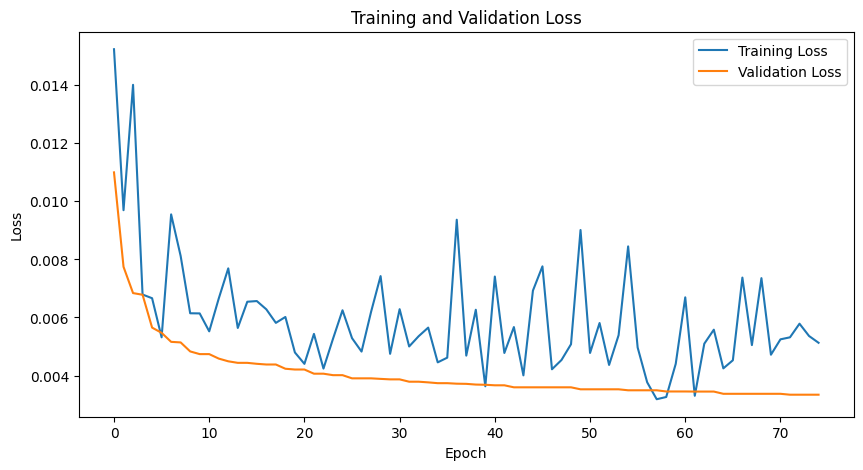

Average PSNR between Sr and reconstructed images: 24.24 dB
Average SSIM between Sr and reconstructed images: 0.6935


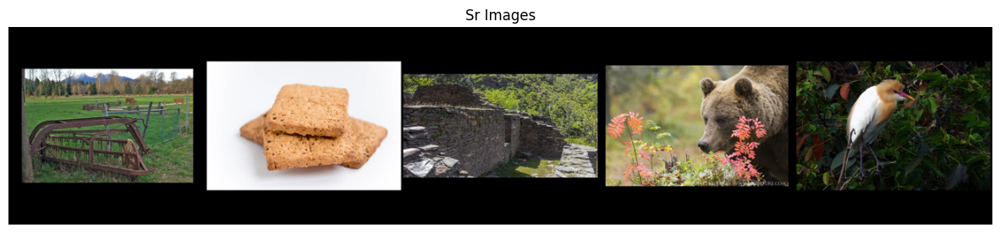

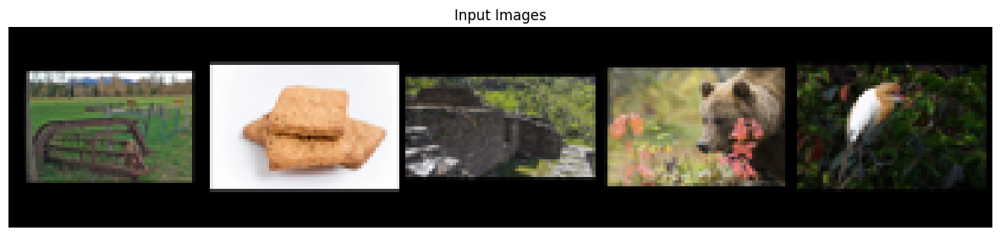

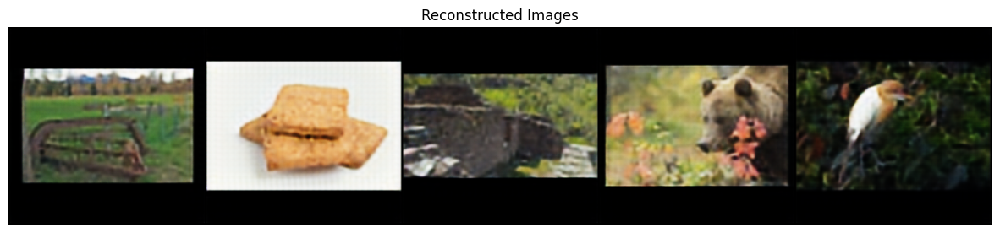

In [71]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=100,
    callbacks=[early_stopping]
)

autoencoder = SrConvAutoencoder()

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Attention U-Net

In [44]:
class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=8):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.fc1 = nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        out = avg_out + max_out
        return self.sigmoid(out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()

        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class SrUNet(pl.LightningModule):
    def __init__(self):
        super(SrUNet, self).__init__()

        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []
        
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.enc5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        self.pool = nn.MaxPool2d(2, 2)  # Downsampling
        
        # Attention mechanisms
        self.ca = ChannelAttention(256)
        self.sa = SpatialAttention()

        # Decoder
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
        )
        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
        )
        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(64, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
        )
        self.dec5 = nn.Sequential(
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=4, padding=1, output_padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=3),
            nn.Sigmoid()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))
        enc5 = self.enc5(self.pool(enc4))

        # Attention
        enc5 = self.ca(enc5) * enc5
        enc5 = self.sa(enc5) * enc5

        # Decoder with skip connections
        dec1 = self.dec1(enc5)
        dec1 = torch.cat((dec1, enc4), dim=1)
        dec2 = self.dec2(dec1)
        dec2 = torch.cat((dec2, enc3), dim=1)
        dec3 = self.dec3(dec2)
        dec3 = torch.cat((dec3, enc2), dim=1)
        dec4 = self.dec4(dec3)
        dec4 = torch.cat((dec4, enc1), dim=1)
        dec5 = self.dec5(dec4)

        return enc5, dec5

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, min_lr=1e-7, verbose=True)
        return {'optimizer': optimizer, 'lr_scheduler': scheduler, 'monitor': 'val/loss'}

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_unet.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))

    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name      | Type             | Params
------------------------------------------------
0  | enc1      | Sequential       | 2.4 K 
1  | enc2      | Sequential       | 12.9 K
2  | enc3      | Sequential       | 18.6 K
3  | enc4      | Sequential       | 74.1 K
4  | enc5      | Sequential       | 295 K 
5  | pool      | MaxPool2d        | 0     
6  | ca        | ChannelAttention | 16.4 K
7  | sa        | SpatialAttention | 98    
8  | dec1      | Sequential       | 295 K 
9  | dec2      | Sequential       | 147 K 
10 | dec3      | Sequential       | 37.0 K
11 | dec4      | Sequential       | 9.3 K 
12 | dec5      | Sequential       | 7.0 K 
13 | criterion | MSELoss          | 0     
------------------------------------------------
916 K     Trainable params
0         Non-trainable params
916 K     Total params
3.665     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
         MaxPool2d-4           [-1, 16, 64, 64]               0
            Conv2d-5           [-1, 32, 64, 64]          12,832
       BatchNorm2d-6           [-1, 32, 64, 64]              64
         LeakyReLU-7           [-1, 32, 64, 64]               0
         MaxPool2d-8           [-1, 32, 32, 32]               0
            Conv2d-9           [-1, 64, 32, 32]          18,496
      BatchNorm2d-10           [-1, 64, 32, 32]             128
        LeakyReLU-11           [-1, 64, 32, 32]               0
        MaxPool2d-12           [-1, 64, 16, 16]               0
           Conv2d-13       

Metric val/loss improved. New best score: 0.032


Epoch 1: 100%|██████████| 67/67 [00:17<00:00,  3.78it/s, v_num=109, train/loss_step=0.0194, val/loss_step=0.0179, val/loss_epoch=0.0175, train/loss_epoch=0.0228]

Metric val/loss improved by 0.015 >= min_delta = 5e-05. New best score: 0.018


Epoch 2: 100%|██████████| 67/67 [00:17<00:00,  3.76it/s, v_num=109, train/loss_step=0.0131, val/loss_step=0.0141, val/loss_epoch=0.0137, train/loss_epoch=0.016] 

Metric val/loss improved by 0.004 >= min_delta = 5e-05. New best score: 0.014


Epoch 3: 100%|██████████| 67/67 [00:17<00:00,  3.75it/s, v_num=109, train/loss_step=0.017, val/loss_step=0.0123, val/loss_epoch=0.0118, train/loss_epoch=0.0133]

Metric val/loss improved by 0.002 >= min_delta = 5e-05. New best score: 0.012


Epoch 4: 100%|██████████| 67/67 [00:17<00:00,  3.75it/s, v_num=109, train/loss_step=0.0113, val/loss_step=0.0111, val/loss_epoch=0.0106, train/loss_epoch=0.0119] 

Metric val/loss improved by 0.001 >= min_delta = 5e-05. New best score: 0.011


Epoch 5: 100%|██████████| 67/67 [00:18<00:00,  3.72it/s, v_num=109, train/loss_step=0.00921, val/loss_step=0.0103, val/loss_epoch=0.00988, train/loss_epoch=0.0109]

Metric val/loss improved by 0.001 >= min_delta = 5e-05. New best score: 0.010


Epoch 6: 100%|██████████| 67/67 [00:17<00:00,  3.77it/s, v_num=109, train/loss_step=0.0112, val/loss_step=0.00982, val/loss_epoch=0.00938, train/loss_epoch=0.0102]

Metric val/loss improved by 0.001 >= min_delta = 5e-05. New best score: 0.009


Epoch 7: 100%|██████████| 67/67 [00:18<00:00,  3.71it/s, v_num=109, train/loss_step=0.00962, val/loss_step=0.00956, val/loss_epoch=0.00915, train/loss_epoch=0.00976]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.009


Epoch 8: 100%|██████████| 67/67 [00:18<00:00,  3.71it/s, v_num=109, train/loss_step=0.0124, val/loss_step=0.00897, val/loss_epoch=0.00859, train/loss_epoch=0.00934] 

Metric val/loss improved by 0.001 >= min_delta = 5e-05. New best score: 0.009


Epoch 9: 100%|██████████| 67/67 [00:17<00:00,  3.72it/s, v_num=109, train/loss_step=0.00808, val/loss_step=0.00867, val/loss_epoch=0.00825, train/loss_epoch=0.00892]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.008


Epoch 11: 100%|██████████| 67/67 [00:18<00:00,  3.65it/s, v_num=109, train/loss_step=0.0116, val/loss_step=0.00816, val/loss_epoch=0.00777, train/loss_epoch=0.00842] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.008


Epoch 13: 100%|██████████| 67/67 [00:18<00:00,  3.72it/s, v_num=109, train/loss_step=0.00745, val/loss_step=0.00794, val/loss_epoch=0.00756, train/loss_epoch=0.00798]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.008


Epoch 14: 100%|██████████| 67/67 [00:18<00:00,  3.68it/s, v_num=109, train/loss_step=0.00656, val/loss_step=0.0074, val/loss_epoch=0.00708, train/loss_epoch=0.00772] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.007


Epoch 15: 100%|██████████| 67/67 [00:18<00:00,  3.64it/s, v_num=109, train/loss_step=0.00853, val/loss_step=0.00716, val/loss_epoch=0.00691, train/loss_epoch=0.00748]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.007


Epoch 17: 100%|██████████| 67/67 [00:18<00:00,  3.70it/s, v_num=109, train/loss_step=0.00571, val/loss_step=0.00673, val/loss_epoch=0.00655, train/loss_epoch=0.00717]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.007


Epoch 18: 100%|██████████| 67/67 [00:19<00:00,  3.53it/s, v_num=109, train/loss_step=0.00641, val/loss_step=0.00659, val/loss_epoch=0.00644, train/loss_epoch=0.00699]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 19: 100%|██████████| 67/67 [00:19<00:00,  3.43it/s, v_num=109, train/loss_step=0.00576, val/loss_step=0.00648, val/loss_epoch=0.00635, train/loss_epoch=0.0069] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 20: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=109, train/loss_step=0.00856, val/loss_step=0.00635, val/loss_epoch=0.00624, train/loss_epoch=0.00682]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 22: 100%|██████████| 67/67 [00:20<00:00,  3.22it/s, v_num=109, train/loss_step=0.0044, val/loss_step=0.0062, val/loss_epoch=0.00612, train/loss_epoch=0.00659]  

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 23: 100%|██████████| 67/67 [00:18<00:00,  3.58it/s, v_num=109, train/loss_step=0.00501, val/loss_step=0.00611, val/loss_epoch=0.00602, train/loss_epoch=0.00649]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 25: 100%|██████████| 67/67 [00:18<00:00,  3.55it/s, v_num=109, train/loss_step=0.00939, val/loss_step=0.00597, val/loss_epoch=0.00589, train/loss_epoch=0.00643]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 27: 100%|██████████| 67/67 [00:18<00:00,  3.66it/s, v_num=109, train/loss_step=0.00722, val/loss_step=0.00584, val/loss_epoch=0.00576, train/loss_epoch=0.0062] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 29: 100%|██████████| 67/67 [00:18<00:00,  3.58it/s, v_num=109, train/loss_step=0.00756, val/loss_step=0.00576, val/loss_epoch=0.00568, train/loss_epoch=0.00619]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 31: 100%|██████████| 67/67 [00:18<00:00,  3.61it/s, v_num=109, train/loss_step=0.00634, val/loss_step=0.00562, val/loss_epoch=0.00557, train/loss_epoch=0.00605]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.006


Epoch 33: 100%|██████████| 67/67 [00:18<00:00,  3.63it/s, v_num=109, train/loss_step=0.00656, val/loss_step=0.00553, val/loss_epoch=0.00548, train/loss_epoch=0.00591]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 36: 100%|██████████| 67/67 [00:18<00:00,  3.54it/s, v_num=109, train/loss_step=0.00437, val/loss_step=0.00545, val/loss_epoch=0.00541, train/loss_epoch=0.00579]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 38: 100%|██████████| 67/67 [00:18<00:00,  3.54it/s, v_num=109, train/loss_step=0.00663, val/loss_step=0.00534, val/loss_epoch=0.0053, train/loss_epoch=0.00572] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 40: 100%|██████████| 67/67 [00:18<00:00,  3.57it/s, v_num=109, train/loss_step=0.00549, val/loss_step=0.00526, val/loss_epoch=0.00522, train/loss_epoch=0.0057] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 43: 100%|██████████| 67/67 [00:19<00:00,  3.51it/s, v_num=109, train/loss_step=0.00637, val/loss_step=0.00516, val/loss_epoch=0.00512, train/loss_epoch=0.00547]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 45: 100%|██████████| 67/67 [00:18<00:00,  3.58it/s, v_num=109, train/loss_step=0.00576, val/loss_step=0.0051, val/loss_epoch=0.00506, train/loss_epoch=0.00546] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 48: 100%|██████████| 67/67 [00:18<00:00,  3.60it/s, v_num=109, train/loss_step=0.00446, val/loss_step=0.00504, val/loss_epoch=0.005, train/loss_epoch=0.0054]   

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 51: 100%|██████████| 67/67 [00:18<00:00,  3.55it/s, v_num=109, train/loss_step=0.00506, val/loss_step=0.00493, val/loss_epoch=0.0049, train/loss_epoch=0.00526] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 55: 100%|██████████| 67/67 [00:19<00:00,  3.39it/s, v_num=109, train/loss_step=0.00586, val/loss_step=0.00484, val/loss_epoch=0.00483, train/loss_epoch=0.00518]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 57: 100%|██████████| 67/67 [00:20<00:00,  3.32it/s, v_num=109, train/loss_step=0.00582, val/loss_step=0.00479, val/loss_epoch=0.00477, train/loss_epoch=0.0051] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 65: 100%|██████████| 67/67 [00:20<00:00,  3.29it/s, v_num=109, train/loss_step=0.0063, val/loss_step=0.00471, val/loss_epoch=0.00472, train/loss_epoch=0.00498] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 66: 100%|██████████| 67/67 [00:20<00:00,  3.24it/s, v_num=109, train/loss_step=0.00472, val/loss_step=0.00462, val/loss_epoch=0.00463, train/loss_epoch=0.00495]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 72: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s, v_num=109, train/loss_step=0.00441, val/loss_step=0.00459, val/loss_epoch=0.00458, train/loss_epoch=0.00489]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 78: 100%|██████████| 67/67 [00:21<00:00,  3.18it/s, v_num=109, train/loss_step=0.0059, val/loss_step=0.00446, val/loss_epoch=0.00448, train/loss_epoch=0.0048]  

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 88: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=109, train/loss_step=0.0056, val/loss_step=0.00437, val/loss_epoch=0.00441, train/loss_epoch=0.00467] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 95: 100%|██████████| 67/67 [00:19<00:00,  3.40it/s, v_num=109, train/loss_step=0.00617, val/loss_step=0.00431, val/loss_epoch=0.00435, train/loss_epoch=0.0046] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 99: 100%|██████████| 67/67 [00:20<00:00,  3.34it/s, v_num=109, train/loss_step=0.0045, val/loss_step=0.0043, val/loss_epoch=0.00434, train/loss_epoch=0.0046]   

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 35:  33%|███▎      | 22/67 [38:11<1:18:06,  0.01it/s, v_num=101, train/loss_step=0.00878, val/loss_step=0.0102, val/loss_epoch=0.00982, train/loss_epoch=0.00989]


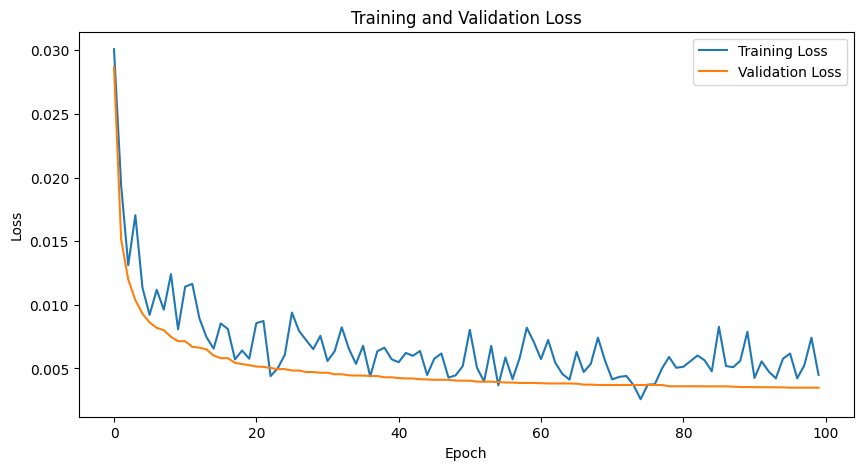

Average PSNR between Sr and reconstructed images: 24.14 dB
Average SSIM between Sr and reconstructed images: 0.6835


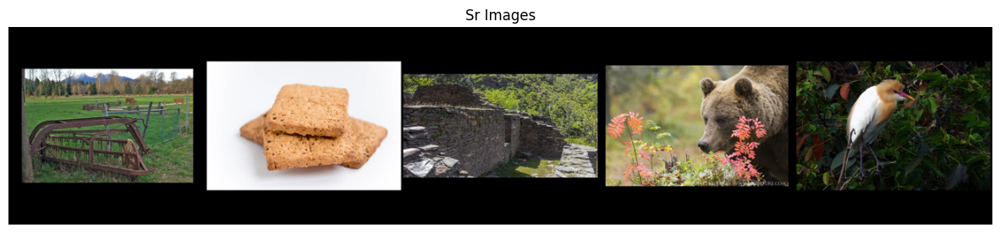

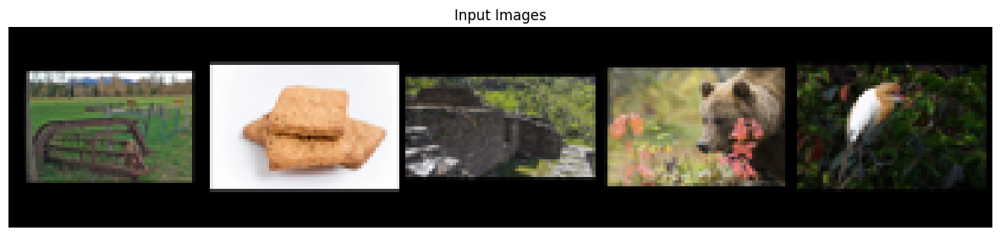

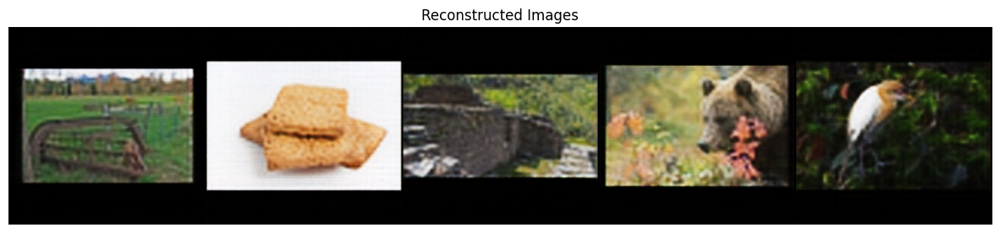

In [45]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=100,
    callbacks=[early_stopping]
)

unet = SrUNet()

trainer.fit(unet, train_dataloader, val_dataloader)

show_images(unet,original_size,scaled_size)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name      | Type             | Params
------------------------------------------------
0  | enc1      | Sequential       | 2.4 K 
1  | enc2      | Sequential       | 12.9 K
2  | enc3      | Sequential       | 18.6 K
3  | enc4      | Sequential       | 74.1 K
4  | enc5      | Sequential       | 295 K 
5  | pool      | MaxPool2d        | 0     
6  | ca        | ChannelAttention | 16.4 K
7  | sa        | SpatialAttention | 98    
8  | dec1      | Sequential       | 295 K 
9  | dec2      | Sequential       | 147 K 
10 | dec3      | Sequential       | 37.0 K
11 | dec4      | Sequential       | 9.3 K 
12 | dec5      | Sequential       | 7.0 K 
13 | criterion | MSELoss          | 0     
------------------------------------------------
916 K     Trainable params
0         Non-trainable params
916 

Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
         MaxPool2d-4           [-1, 16, 64, 64]               0
            Conv2d-5           [-1, 32, 64, 64]          12,832
       BatchNorm2d-6           [-1, 32, 64, 64]              64
         LeakyReLU-7           [-1, 32, 64, 64]               0
         MaxPool2d-8           [-1, 32, 32, 32]               0
            Conv2d-9           [-1, 64, 32, 32]          18,496
      BatchNorm2d-10           [-1, 64, 32, 32]             128
        LeakyReLU-11           [-1, 64, 32, 32]               0
        MaxPool2d-12           [-1, 64, 16, 16]               0
           Conv2d-13       

Metric val/loss improved. New best score: 0.004


Epoch 1: 100%|██████████| 67/67 [00:20<00:00,  3.29it/s, v_num=110, train/loss_step=0.00526, val/loss_step=0.00426, val/loss_epoch=0.0043, train/loss_epoch=0.0046]  

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 14: 100%|██████████| 67/67 [00:20<00:00,  3.28it/s, v_num=110, train/loss_step=0.00507, val/loss_step=0.00417, val/loss_epoch=0.00423, train/loss_epoch=0.00442]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 24: 100%|██████████| 67/67 [00:21<00:00,  3.11it/s, v_num=110, train/loss_step=0.00438, val/loss_step=0.00412, val/loss_epoch=0.00418, train/loss_epoch=0.00446]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 43: 100%|██████████| 67/67 [00:19<00:00,  3.35it/s, v_num=110, train/loss_step=0.00434, val/loss_step=0.00406, val/loss_epoch=0.00412, train/loss_epoch=0.00428]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 61: 100%|██████████| 67/67 [00:20<00:00,  3.25it/s, v_num=110, train/loss_step=0.00565, val/loss_step=0.00399, val/loss_epoch=0.00406, train/loss_epoch=0.00421]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 86: 100%|██████████| 67/67 [00:21<00:00,  3.14it/s, v_num=110, train/loss_step=0.00499, val/loss_step=0.004, val/loss_epoch=0.00405, train/loss_epoch=0.00412]  

Monitored metric val/loss did not improve in the last 25 records. Best score: 0.004. Signaling Trainer to stop.


Epoch 86: 100%|██████████| 67/67 [00:21<00:00,  3.12it/s, v_num=110, train/loss_step=0.00499, val/loss_step=0.004, val/loss_epoch=0.00405, train/loss_epoch=0.00412]


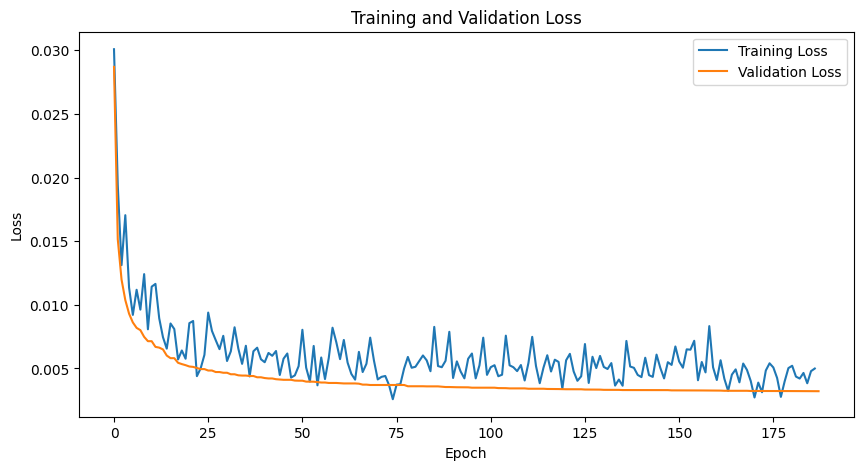

Average PSNR between Sr and reconstructed images: 24.30 dB
Average SSIM between Sr and reconstructed images: 0.6989


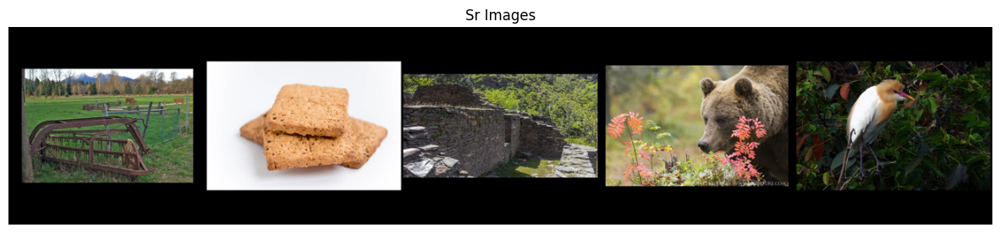

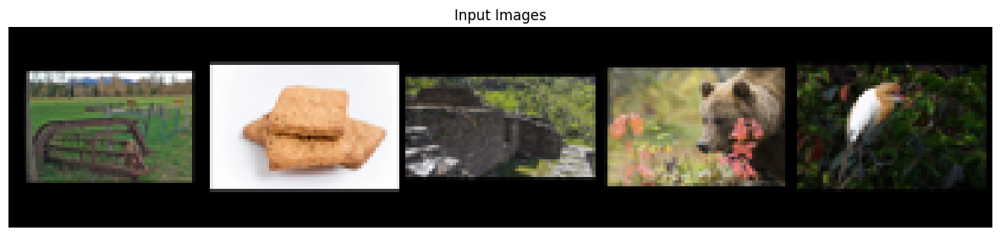

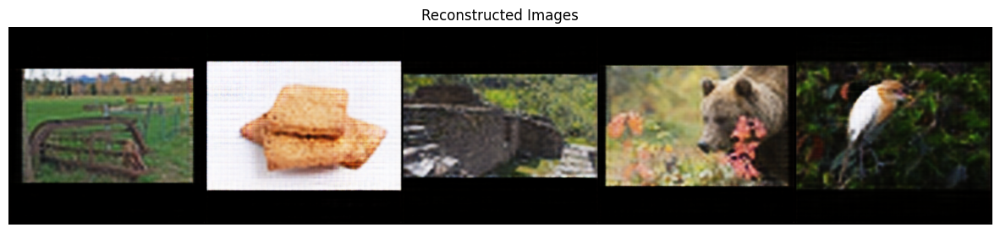

In [46]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=25,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=100,
    callbacks=[early_stopping]
)

trainer.fit(unet, train_dataloader, val_dataloader)

show_images(unet,original_size,scaled_size)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name      | Type             | Params
------------------------------------------------
0  | enc1      | Sequential       | 2.4 K 
1  | enc2      | Sequential       | 12.9 K
2  | enc3      | Sequential       | 18.6 K
3  | enc4      | Sequential       | 74.1 K
4  | enc5      | Sequential       | 295 K 
5  | pool      | MaxPool2d        | 0     
6  | ca        | ChannelAttention | 16.4 K
7  | sa        | SpatialAttention | 98    
8  | dec1      | Sequential       | 295 K 
9  | dec2      | Sequential       | 147 K 
10 | dec3      | Sequential       | 37.0 K
11 | dec4      | Sequential       | 9.3 K 
12 | dec5      | Sequential       | 7.0 K 
13 | criterion | MSELoss          | 0     
------------------------------------------------
916 K     Trainable params
0         Non-trainable params
916 

Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
         MaxPool2d-4           [-1, 16, 64, 64]               0
            Conv2d-5           [-1, 32, 64, 64]          12,832
       BatchNorm2d-6           [-1, 32, 64, 64]              64
         LeakyReLU-7           [-1, 32, 64, 64]               0
         MaxPool2d-8           [-1, 32, 32, 32]               0
            Conv2d-9           [-1, 64, 32, 32]          18,496
      BatchNorm2d-10           [-1, 64, 32, 32]             128
        LeakyReLU-11           [-1, 64, 32, 32]               0
        MaxPool2d-12           [-1, 64, 16, 16]               0
           Conv2d-13       

Metric val/loss improved. New best score: 0.004


Epoch 12: 100%|██████████| 67/67 [00:22<00:00,  2.95it/s, v_num=111, train/loss_step=0.00417, val/loss_step=0.00394, val/loss_epoch=0.00401, train/loss_epoch=0.0041] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 37: 100%|██████████| 67/67 [00:23<00:00,  2.88it/s, v_num=111, train/loss_step=0.00525, val/loss_step=0.00392, val/loss_epoch=0.004, train/loss_epoch=0.00406]  

Monitored metric val/loss did not improve in the last 25 records. Best score: 0.004. Signaling Trainer to stop.


Epoch 37: 100%|██████████| 67/67 [00:23<00:00,  2.87it/s, v_num=111, train/loss_step=0.00525, val/loss_step=0.00392, val/loss_epoch=0.004, train/loss_epoch=0.00406]


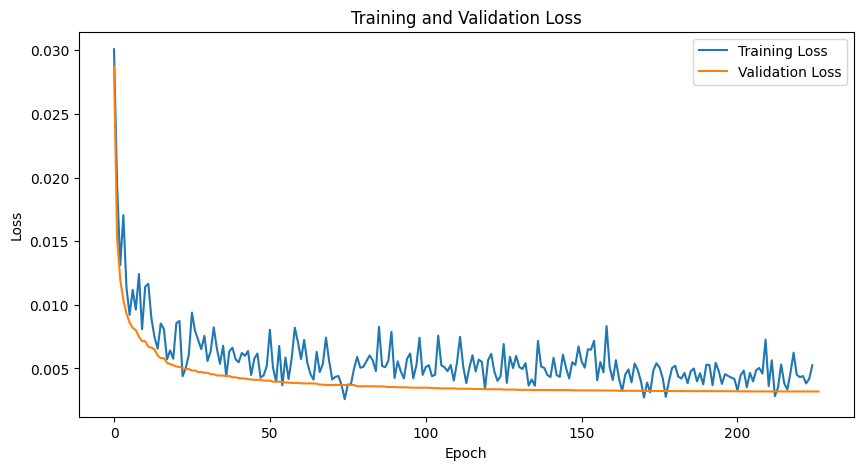

Average PSNR between Sr and reconstructed images: 24.48 dB
Average SSIM between Sr and reconstructed images: 0.7082


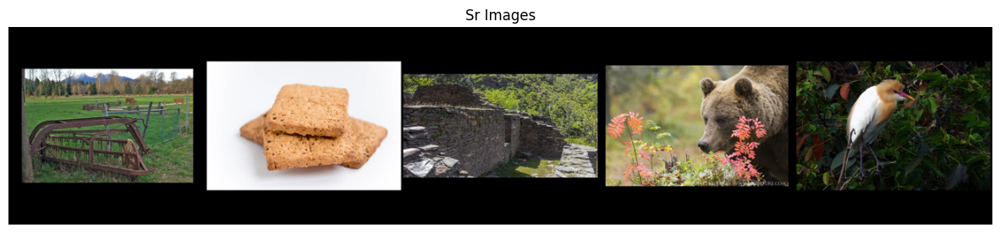

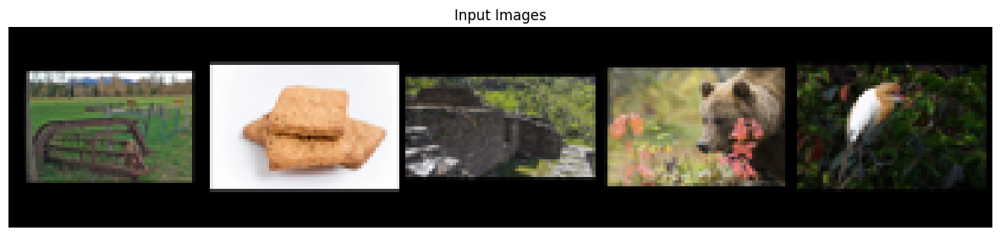

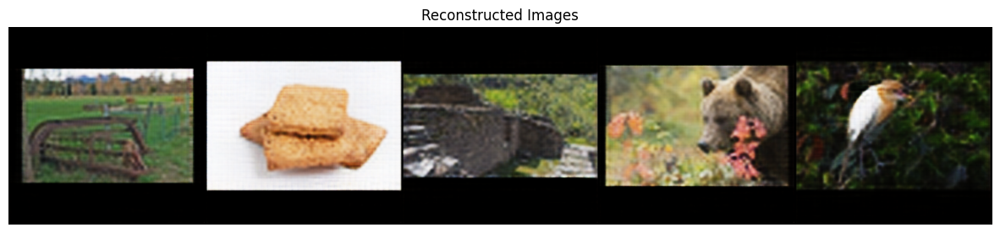

In [47]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=25,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00001
)

trainer = pl.Trainer(
    max_epochs=200,
    callbacks=[early_stopping]
)

trainer.fit(unet, train_dataloader, val_dataloader)

show_images(unet,original_size,scaled_size)

## Attention U-Net & sharpening kernel

In [61]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
import matplotlib.pyplot as plt
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchsummary import summary

class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=8):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.fc1 = nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        out = avg_out + max_out
        return self.sigmoid(out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()

        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class SrUNet(pl.LightningModule):
    def __init__(self):
        super(SrUNet, self).__init__()

        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []
        
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.enc5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        self.pool = nn.MaxPool2d(2, 2)  # Downsampling
        
        # Attention mechanisms
        self.ca = ChannelAttention(256)
        self.sa = SpatialAttention()

        # Decoder
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
        )
        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
        )
        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(64, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
        )
        self.dec5 = nn.Sequential(
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=4, padding=1, output_padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=3),
            nn.Sigmoid()
        )

        self.criterion = nn.MSELoss()
        
        self.laplacian_kernel = torch.tensor([
            [[[0, -1, 0], [-1, 4, -1], [0, -1, 0]]],
            [[[0, -1, 0], [-1, 4, -1], [0, -1, 0]]],
            [[[0, -1, 0], [-1, 4, -1], [0, -1, 0]]]
        ], dtype=torch.float32).to(self.device)
        # Calcolo della somma dei valori assoluti degli elementi del kernel
        abs_sum = self.laplacian_kernel.abs().sum()
        # Normalizzazione del kernel
        self.normalized_kernel = self.laplacian_kernel / abs_sum

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))
        enc5 = self.enc5(self.pool(enc4))

        # Attention
        enc5 = self.ca(enc5) * enc5
        enc5 = self.sa(enc5) * enc5

        # Decoder with skip connections
        dec1 = self.dec1(enc5)
        dec1 = torch.cat((dec1, enc4), dim=1)
        dec2 = self.dec2(dec1)
        dec2 = torch.cat((dec2, enc3), dim=1)
        dec3 = self.dec3(dec2)
        dec3 = torch.cat((dec3, enc2), dim=1)
        dec4 = self.dec4(dec3)
        dec4 = torch.cat((dec4, enc1), dim=1)
        dec5 = self.dec5(dec4)
        
        laplacian = F.conv2d(dec5, self.normalized_kernel.to(device), padding=1, groups=3)
        sharpened = dec5 + laplacian
        sharpened = torch.clamp(sharpened, 0, 1)

        return enc5, sharpened

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, min_lr=1e-7, verbose=True)
        return {'optimizer': optimizer, 'lr_scheduler': scheduler, 'monitor': 'val/loss'}

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_unet_sharpening.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))

    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name      | Type             | Params
------------------------------------------------
0  | enc1      | Sequential       | 2.4 K 
1  | enc2      | Sequential       | 12.9 K
2  | enc3      | Sequential       | 18.6 K
3  | enc4      | Sequential       | 74.1 K
4  | enc5      | Sequential       | 295 K 
5  | pool      | MaxPool2d        | 0     
6  | ca        | ChannelAttention | 16.4 K
7  | sa        | SpatialAttention | 98    
8  | dec1      | Sequential       | 295 K 
9  | dec2      | Sequential       | 147 K 
10 | dec3      | Sequential       | 37.0 K
11 | dec4      | Sequential       | 9.3 K 
12 | dec5      | Sequential       | 7.0 K 
13 | criterion | MSELoss          | 0     
------------------------------------------------
916 K     Trainable params
0         Non-trainable params
916 K     Total params
3.665     Total estimated model params size (MB)

   | 

Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
         MaxPool2d-4           [-1, 16, 64, 64]               0
            Conv2d-5           [-1, 32, 64, 64]          12,832
       BatchNorm2d-6           [-1, 32, 64, 64]              64
         LeakyReLU-7           [-1, 32, 64, 64]               0
         MaxPool2d-8           [-1, 32, 32, 32]               0
            Conv2d-9           [-1, 64, 32, 32]          18,496
      BatchNorm2d-10           [-1, 64, 32, 32]             128
        LeakyReLU-11           [-1, 64, 32, 32]               0
        MaxPool2d-12           [-1, 64, 16, 16]               0
           Conv2d-13       

Metric val/loss improved. New best score: 0.037
Metric val/loss improved. New best score: 0.037


Epoch 1: 100%|██████████| 67/67 [00:17<00:00,  3.84it/s, v_num=138, train/loss_step=0.0244, val/loss_step=0.0196, val/loss_epoch=0.0193, train/loss_epoch=0.0257]

Metric val/loss improved by 0.018 >= min_delta = 1e-05. New best score: 0.019
Metric val/loss improved by 0.018 >= min_delta = 1e-05. New best score: 0.019


Epoch 2: 100%|██████████| 67/67 [00:17<00:00,  3.84it/s, v_num=138, train/loss_step=0.0143, val/loss_step=0.0157, val/loss_epoch=0.0156, train/loss_epoch=0.0177]

Metric val/loss improved by 0.004 >= min_delta = 1e-05. New best score: 0.016
Metric val/loss improved by 0.004 >= min_delta = 1e-05. New best score: 0.016


Epoch 3: 100%|██████████| 67/67 [00:17<00:00,  3.83it/s, v_num=138, train/loss_step=0.0142, val/loss_step=0.0131, val/loss_epoch=0.0129, train/loss_epoch=0.0147]

Metric val/loss improved by 0.003 >= min_delta = 1e-05. New best score: 0.013
Metric val/loss improved by 0.003 >= min_delta = 1e-05. New best score: 0.013


Epoch 4: 100%|██████████| 67/67 [00:17<00:00,  3.82it/s, v_num=138, train/loss_step=0.0147, val/loss_step=0.0118, val/loss_epoch=0.0114, train/loss_epoch=0.0127] 

Metric val/loss improved by 0.002 >= min_delta = 1e-05. New best score: 0.011
Metric val/loss improved by 0.002 >= min_delta = 1e-05. New best score: 0.011


Epoch 5: 100%|██████████| 67/67 [00:17<00:00,  3.77it/s, v_num=138, train/loss_step=0.00977, val/loss_step=0.0108, val/loss_epoch=0.0104, train/loss_epoch=0.0114]

Metric val/loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.010
Metric val/loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.010


Epoch 6: 100%|██████████| 67/67 [00:17<00:00,  3.79it/s, v_num=138, train/loss_step=0.0121, val/loss_step=0.0103, val/loss_epoch=0.00982, train/loss_epoch=0.0107]

Metric val/loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.010
Metric val/loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.010


Epoch 7: 100%|██████████| 67/67 [00:18<00:00,  3.72it/s, v_num=138, train/loss_step=0.00774, val/loss_step=0.00982, val/loss_epoch=0.0094, train/loss_epoch=0.0102]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009


Epoch 8: 100%|██████████| 67/67 [00:18<00:00,  3.68it/s, v_num=138, train/loss_step=0.00881, val/loss_step=0.00941, val/loss_epoch=0.00899, train/loss_epoch=0.00975]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009


Epoch 9: 100%|██████████| 67/67 [00:18<00:00,  3.68it/s, v_num=138, train/loss_step=0.00894, val/loss_step=0.0091, val/loss_epoch=0.00871, train/loss_epoch=0.00941] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009


Epoch 10: 100%|██████████| 67/67 [00:18<00:00,  3.66it/s, v_num=138, train/loss_step=0.00973, val/loss_step=0.00883, val/loss_epoch=0.00841, train/loss_epoch=0.00908]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008


Epoch 11: 100%|██████████| 67/67 [00:18<00:00,  3.64it/s, v_num=138, train/loss_step=0.00813, val/loss_step=0.00855, val/loss_epoch=0.00814, train/loss_epoch=0.00879]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008


Epoch 12: 100%|██████████| 67/67 [00:18<00:00,  3.57it/s, v_num=138, train/loss_step=0.00786, val/loss_step=0.00828, val/loss_epoch=0.0079, train/loss_epoch=0.00859] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008


Epoch 13: 100%|██████████| 67/67 [00:18<00:00,  3.55it/s, v_num=138, train/loss_step=0.00755, val/loss_step=0.00809, val/loss_epoch=0.00775, train/loss_epoch=0.00829]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008


Epoch 14: 100%|██████████| 67/67 [00:18<00:00,  3.59it/s, v_num=138, train/loss_step=0.00808, val/loss_step=0.00779, val/loss_epoch=0.00745, train/loss_epoch=0.00815]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 16: 100%|██████████| 67/67 [00:18<00:00,  3.54it/s, v_num=138, train/loss_step=0.0129, val/loss_step=0.00745, val/loss_epoch=0.00715, train/loss_epoch=0.0078]  

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 17: 100%|██████████| 67/67 [00:18<00:00,  3.54it/s, v_num=138, train/loss_step=0.0133, val/loss_step=0.00739, val/loss_epoch=0.00713, train/loss_epoch=0.00764]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 18: 100%|██████████| 67/67 [00:18<00:00,  3.54it/s, v_num=138, train/loss_step=0.00788, val/loss_step=0.00717, val/loss_epoch=0.00691, train/loss_epoch=0.00744]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 19: 100%|██████████| 67/67 [00:19<00:00,  3.51it/s, v_num=138, train/loss_step=0.00641, val/loss_step=0.00705, val/loss_epoch=0.00681, train/loss_epoch=0.00731]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 20: 100%|██████████| 67/67 [00:19<00:00,  3.51it/s, v_num=138, train/loss_step=0.0096, val/loss_step=0.00686, val/loss_epoch=0.00665, train/loss_epoch=0.00718] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 21: 100%|██████████| 67/67 [00:19<00:00,  3.51it/s, v_num=138, train/loss_step=0.00682, val/loss_step=0.00682, val/loss_epoch=0.00661, train/loss_epoch=0.00707]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 23: 100%|██████████| 67/67 [00:19<00:00,  3.50it/s, v_num=138, train/loss_step=0.00781, val/loss_step=0.00679, val/loss_epoch=0.00656, train/loss_epoch=0.00693]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Epoch 24: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.00508, val/loss_step=0.00649, val/loss_epoch=0.00631, train/loss_epoch=0.00677]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 25: 100%|██████████| 67/67 [00:19<00:00,  3.51it/s, v_num=138, train/loss_step=0.00589, val/loss_step=0.00642, val/loss_epoch=0.00626, train/loss_epoch=0.0067] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 26: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00601, val/loss_step=0.00629, val/loss_epoch=0.00616, train/loss_epoch=0.00661]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 27: 100%|██████████| 67/67 [00:19<00:00,  3.52it/s, v_num=138, train/loss_step=0.00928, val/loss_step=0.0062, val/loss_epoch=0.00607, train/loss_epoch=0.0066]  

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 29: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.00702, val/loss_step=0.00605, val/loss_epoch=0.00594, train/loss_epoch=0.00649]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 30: 100%|██████████| 67/67 [00:19<00:00,  3.45it/s, v_num=138, train/loss_step=0.00692, val/loss_step=0.00598, val/loss_epoch=0.00588, train/loss_epoch=0.00638]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 32: 100%|██████████| 67/67 [00:20<00:00,  3.27it/s, v_num=138, train/loss_step=0.00919, val/loss_step=0.00587, val/loss_epoch=0.00579, train/loss_epoch=0.00625]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 33: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.00602, val/loss_step=0.0058, val/loss_epoch=0.00573, train/loss_epoch=0.00625] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 35: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.007, val/loss_step=0.00571, val/loss_epoch=0.00563, train/loss_epoch=0.00605]  

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 36: 100%|██████████| 67/67 [00:19<00:00,  3.49it/s, v_num=138, train/loss_step=0.00694, val/loss_step=0.00568, val/loss_epoch=0.0056, train/loss_epoch=0.006]   

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 37: 100%|██████████| 67/67 [00:19<00:00,  3.50it/s, v_num=138, train/loss_step=0.00634, val/loss_step=0.00561, val/loss_epoch=0.00554, train/loss_epoch=0.006]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Epoch 39: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.00867, val/loss_step=0.00548, val/loss_epoch=0.00543, train/loss_epoch=0.00581]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 40: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.00556, val/loss_step=0.00543, val/loss_epoch=0.00538, train/loss_epoch=0.00588]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 41: 100%|██████████| 67/67 [00:19<00:00,  3.50it/s, v_num=138, train/loss_step=0.00497, val/loss_step=0.00541, val/loss_epoch=0.00536, train/loss_epoch=0.00577]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 42: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.00738, val/loss_step=0.00534, val/loss_epoch=0.00529, train/loss_epoch=0.00567]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 45: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00535, val/loss_step=0.00526, val/loss_epoch=0.00522, train/loss_epoch=0.00556]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 46: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00897, val/loss_step=0.0052, val/loss_epoch=0.00516, train/loss_epoch=0.00553] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 47: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.00503, val/loss_step=0.00513, val/loss_epoch=0.00509, train/loss_epoch=0.00551]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 49: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.0046, val/loss_step=0.00509, val/loss_epoch=0.00506, train/loss_epoch=0.00541] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 51: 100%|██████████| 67/67 [00:19<00:00,  3.50it/s, v_num=138, train/loss_step=0.00778, val/loss_step=0.00499, val/loss_epoch=0.00496, train/loss_epoch=0.00536]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 53: 100%|██████████| 67/67 [00:19<00:00,  3.52it/s, v_num=138, train/loss_step=0.00684, val/loss_step=0.00494, val/loss_epoch=0.00492, train/loss_epoch=0.00531]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 56: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00428, val/loss_step=0.00488, val/loss_epoch=0.00487, train/loss_epoch=0.00522]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 57: 100%|██████████| 67/67 [00:19<00:00,  3.45it/s, v_num=138, train/loss_step=0.00582, val/loss_step=0.00487, val/loss_epoch=0.00485, train/loss_epoch=0.00518]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 58: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.00525, val/loss_step=0.00483, val/loss_epoch=0.00481, train/loss_epoch=0.00514]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 59: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.00507, val/loss_step=0.00479, val/loss_epoch=0.00478, train/loss_epoch=0.00515]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 61: 100%|██████████| 67/67 [00:19<00:00,  3.47it/s, v_num=138, train/loss_step=0.00494, val/loss_step=0.00476, val/loss_epoch=0.00476, train/loss_epoch=0.00506]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 62: 100%|██████████| 67/67 [00:19<00:00,  3.49it/s, v_num=138, train/loss_step=0.0063, val/loss_step=0.00474, val/loss_epoch=0.00475, train/loss_epoch=0.00513] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 64: 100%|██████████| 67/67 [00:19<00:00,  3.41it/s, v_num=138, train/loss_step=0.00863, val/loss_step=0.00473, val/loss_epoch=0.00473, train/loss_epoch=0.00517]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 66: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00586, val/loss_step=0.00467, val/loss_epoch=0.00466, train/loss_epoch=0.005]  

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 69: 100%|██████████| 67/67 [00:19<00:00,  3.49it/s, v_num=138, train/loss_step=0.00559, val/loss_step=0.00462, val/loss_epoch=0.00462, train/loss_epoch=0.00489]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 72: 100%|██████████| 67/67 [00:19<00:00,  3.49it/s, v_num=138, train/loss_step=0.00437, val/loss_step=0.00461, val/loss_epoch=0.00461, train/loss_epoch=0.00495]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 74: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00654, val/loss_step=0.00459, val/loss_epoch=0.00459, train/loss_epoch=0.00494]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 76: 100%|██████████| 67/67 [00:19<00:00,  3.49it/s, v_num=138, train/loss_step=0.00752, val/loss_step=0.00457, val/loss_epoch=0.00457, train/loss_epoch=0.00492]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 77: 100%|██████████| 67/67 [00:19<00:00,  3.42it/s, v_num=138, train/loss_step=0.00704, val/loss_step=0.00455, val/loss_epoch=0.00456, train/loss_epoch=0.00489]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 78: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.00545, val/loss_step=0.00453, val/loss_epoch=0.00453, train/loss_epoch=0.00482]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Epoch 80: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.00315, val/loss_step=0.00448, val/loss_epoch=0.00449, train/loss_epoch=0.00477]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 84: 100%|██████████| 67/67 [00:19<00:00,  3.42it/s, v_num=138, train/loss_step=0.00486, val/loss_step=0.00444, val/loss_epoch=0.00446, train/loss_epoch=0.00478]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 88: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00452, val/loss_step=0.00443, val/loss_epoch=0.00445, train/loss_epoch=0.00468]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 91: 100%|██████████| 67/67 [00:19<00:00,  3.48it/s, v_num=138, train/loss_step=0.00347, val/loss_step=0.0044, val/loss_epoch=0.00442, train/loss_epoch=0.00468] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 92: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.00505, val/loss_step=0.00438, val/loss_epoch=0.0044, train/loss_epoch=0.00472]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 95: 100%|██████████| 67/67 [00:19<00:00,  3.45it/s, v_num=138, train/loss_step=0.00388, val/loss_step=0.00434, val/loss_epoch=0.00437, train/loss_epoch=0.00467]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 100: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.0043, val/loss_step=0.00432, val/loss_epoch=0.00434, train/loss_epoch=0.00466]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 103: 100%|██████████| 67/67 [00:19<00:00,  3.45it/s, v_num=138, train/loss_step=0.00356, val/loss_step=0.00429, val/loss_epoch=0.00432, train/loss_epoch=0.00458]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 109: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.0055, val/loss_step=0.00429, val/loss_epoch=0.00431, train/loss_epoch=0.00457] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 111: 100%|██████████| 67/67 [00:19<00:00,  3.40it/s, v_num=138, train/loss_step=0.00609, val/loss_step=0.00425, val/loss_epoch=0.00428, train/loss_epoch=0.00454]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 113: 100%|██████████| 67/67 [00:19<00:00,  3.41it/s, v_num=138, train/loss_step=0.0044, val/loss_step=0.00422, val/loss_epoch=0.00426, train/loss_epoch=0.0045]  

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 119: 100%|██████████| 67/67 [00:19<00:00,  3.45it/s, v_num=138, train/loss_step=0.00624, val/loss_step=0.00419, val/loss_epoch=0.00423, train/loss_epoch=0.00447]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 128: 100%|██████████| 67/67 [00:19<00:00,  3.42it/s, v_num=138, train/loss_step=0.00645, val/loss_step=0.00417, val/loss_epoch=0.00422, train/loss_epoch=0.00443]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 131: 100%|██████████| 67/67 [00:19<00:00,  3.46it/s, v_num=138, train/loss_step=0.00539, val/loss_step=0.00415, val/loss_epoch=0.0042, train/loss_epoch=0.00447] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 133: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.00547, val/loss_step=0.00414, val/loss_epoch=0.00419, train/loss_epoch=0.00441]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 138: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.00553, val/loss_step=0.00411, val/loss_epoch=0.00416, train/loss_epoch=0.00437]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 145: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.00547, val/loss_step=0.00409, val/loss_epoch=0.00414, train/loss_epoch=0.00432]

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 154: 100%|██████████| 67/67 [00:20<00:00,  3.34it/s, v_num=138, train/loss_step=0.0035, val/loss_step=0.00407, val/loss_epoch=0.00413, train/loss_epoch=0.00425] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 162: 100%|██████████| 67/67 [00:19<00:00,  3.44it/s, v_num=138, train/loss_step=0.0038, val/loss_step=0.00406, val/loss_epoch=0.00412, train/loss_epoch=0.00424] 

Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004
Metric val/loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Epoch 187: 100%|██████████| 67/67 [00:19<00:00,  3.36it/s, v_num=138, train/loss_step=0.00508, val/loss_step=0.00405, val/loss_epoch=0.00411, train/loss_epoch=0.00421]

Monitored metric val/loss did not improve in the last 25 records. Best score: 0.004. Signaling Trainer to stop.
Monitored metric val/loss did not improve in the last 25 records. Best score: 0.004. Signaling Trainer to stop.


Epoch 187: 100%|██████████| 67/67 [00:20<00:00,  3.35it/s, v_num=138, train/loss_step=0.00508, val/loss_step=0.00405, val/loss_epoch=0.00411, train/loss_epoch=0.00421]


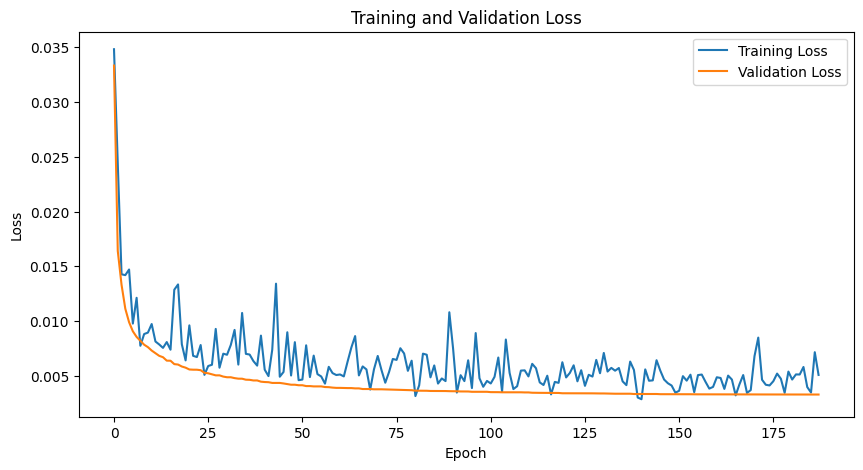

Average PSNR between Sr and reconstructed images: 24.25 dB
Average SSIM between Sr and reconstructed images: 0.7100


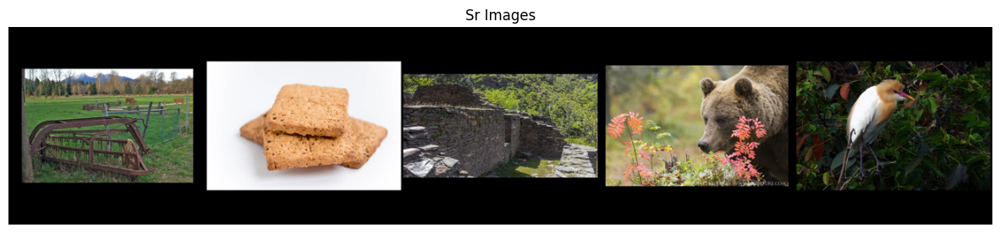

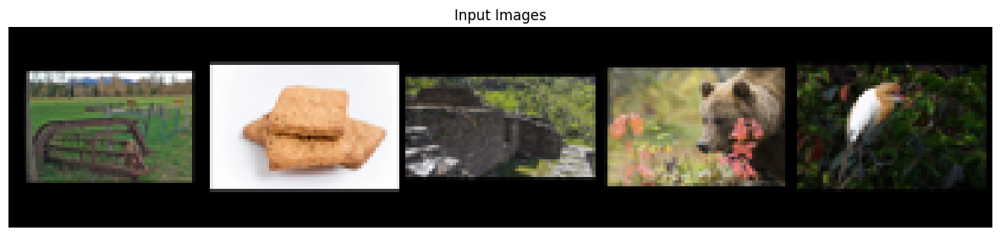

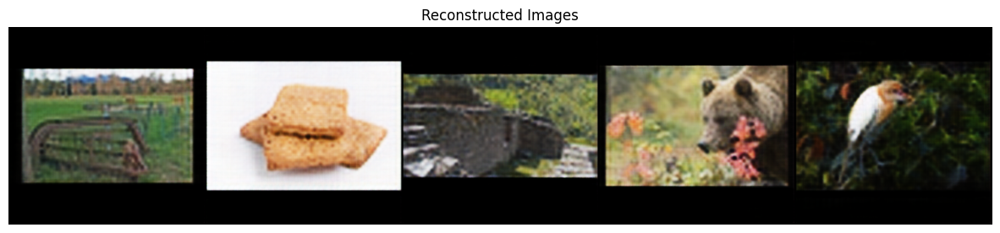

In [63]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=25,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00001
)

trainer = pl.Trainer(
    max_epochs=200,
    callbacks=[early_stopping]
)

unet = SrUNet()


trainer.fit(unet, train_dataloader, val_dataloader)

show_images(unet,original_size,scaled_size)